In [1]:
import numpy
import torch.nn.functional as F
import matplotlib.pyplot as plt
from timeit import default_timer
from catheter import *
from utilities3 import *
from Adam import Adam

torch.manual_seed(0)
np.random.seed(0)
torch.cuda.manual_seed(0)
torch.backends.cudnn.deterministic = True
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print("device is ", (device))

device is  cuda


# Real-time design optimization 

During optimization, we start from initial design parameters
$(L_p = 100, x2 = -40, x3 = -30, h = 25.0) \mu m$, and update them using the BFGS algorithm to minimize the objective function ⟨Xup⟩ post-processed from the bacteria population predicted by Geo-FNO. When the optimization gets trapped in a local minimizer, the optimization restarts from an initial condition obtained by perturbing the recordedglobal minimizer with a random Gaussian noise sampled from $N(0, I)$. The proposed randomized BFGS algorithm guarantees the recorded-global minimizer monotonically decreases. 

initialize :  [ 1.32175584 -0.40546511  1.79175947  0.        ]
L_p, x1, x2, x3, h  =  100.0 -50.0 -40.000003814697266 -30.0 25.0


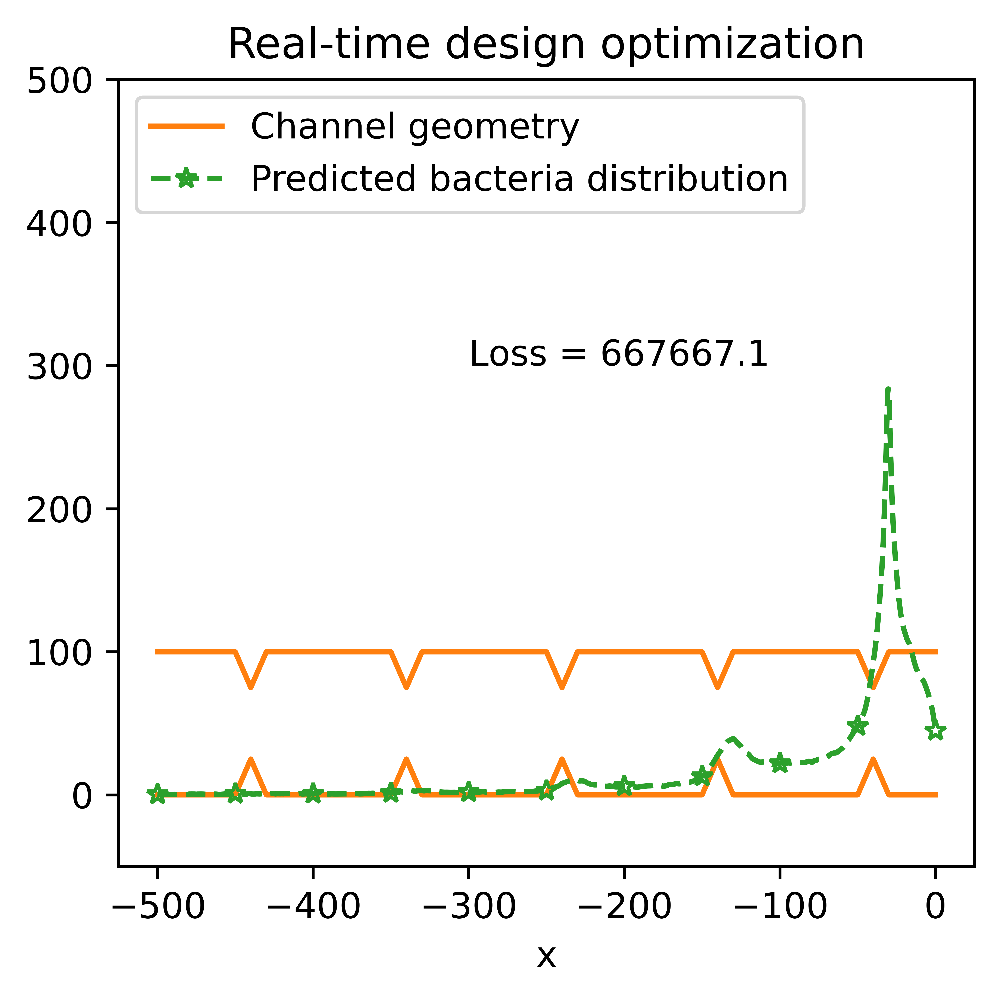

0 0.7401150735095143 loss =  644849.125 loss_min =  inf
L_p, x1, x2, x3, h  =  68.6058349609375 -34.30291748046875 -36.65972900390625 -16.566036224365234 25.33048439025879


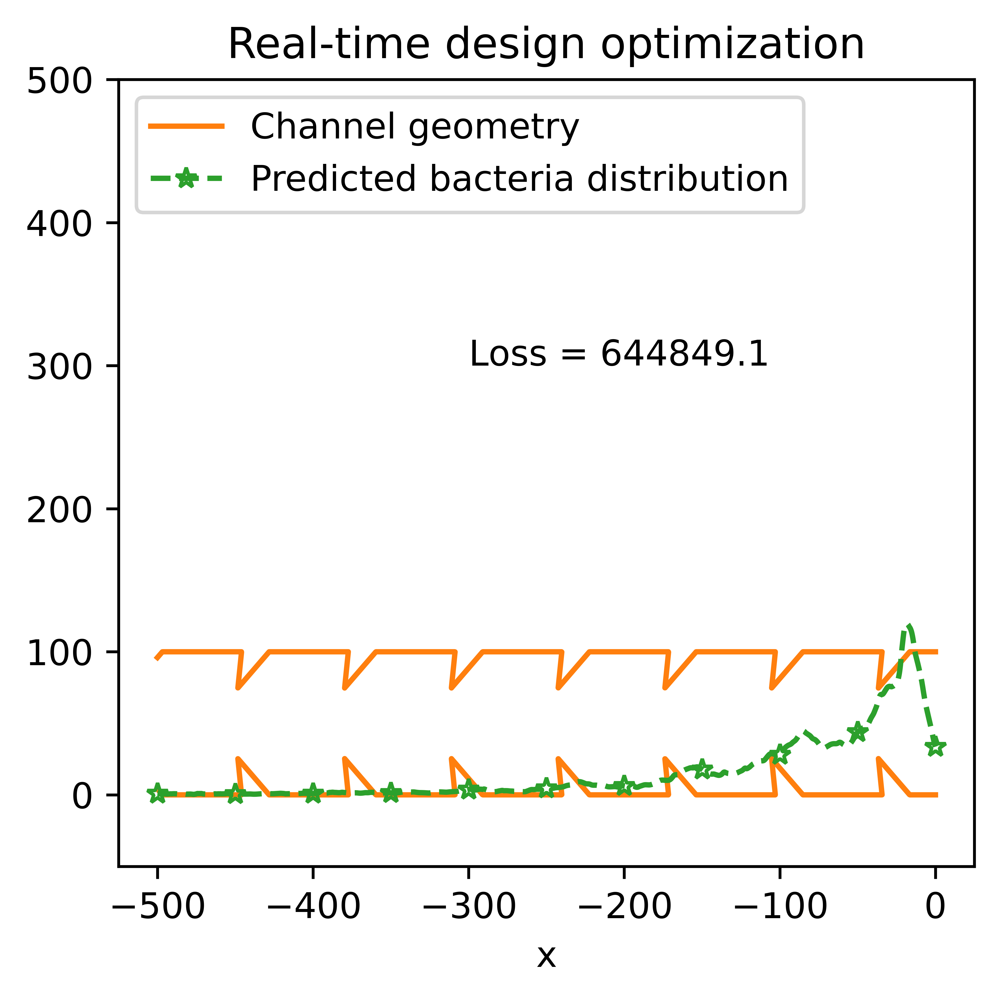

1 0.14252001978456974 loss =  981339.0625 loss_min =  644849.125
2 0.5144524043425918 loss =  331141.125 loss_min =  644849.125
L_p, x1, x2, x3, h  =  61.496620178222656 -30.748310089111328 -22.318721771240234 -14.86485767364502 27.015342712402344


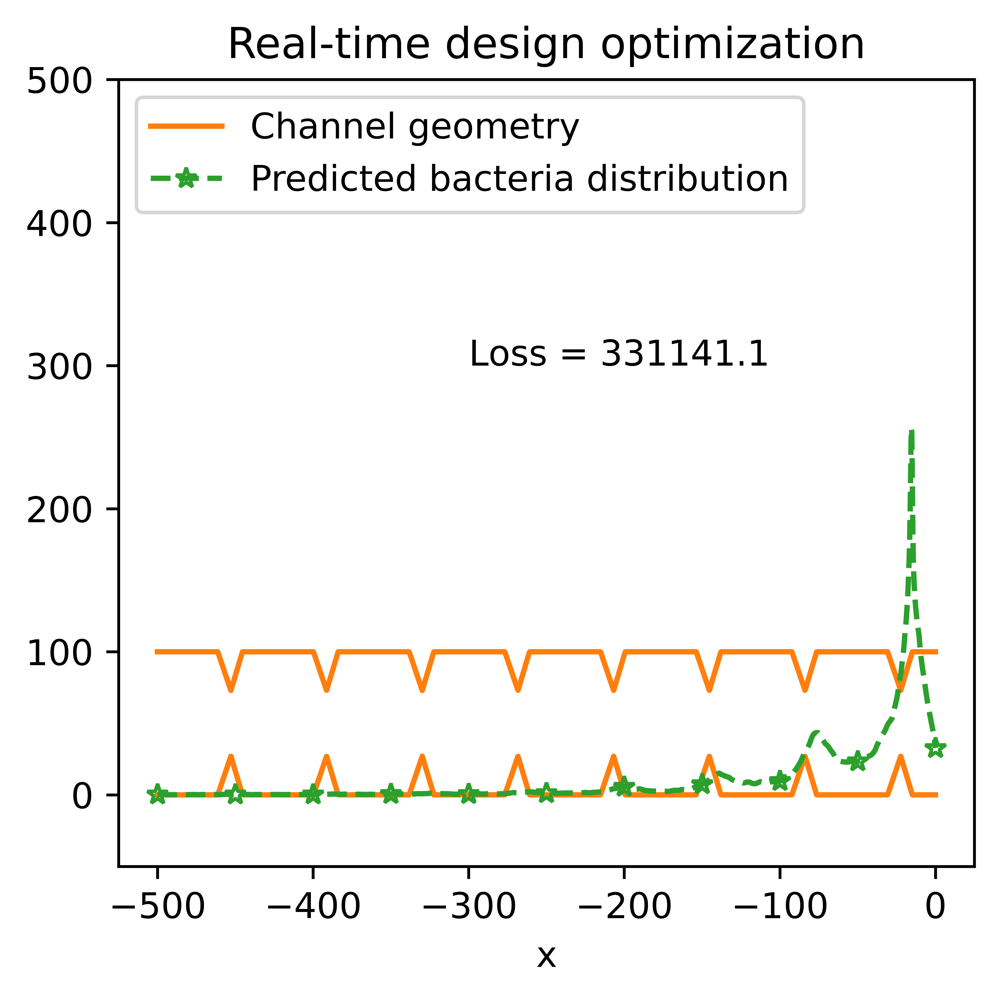

3 0.16085319127887487 loss =  563636.1875 loss_min =  331141.125
4 0.1606156313791871 loss =  357645.21875 loss_min =  331141.125
5 0.4697949569672346 loss =  268829.5 loss_min =  331141.125
L_p, x1, x2, x3, h  =  60.32224655151367 -30.161123275756836 -20.824108123779297 -14.540406227111816 28.617618560791016


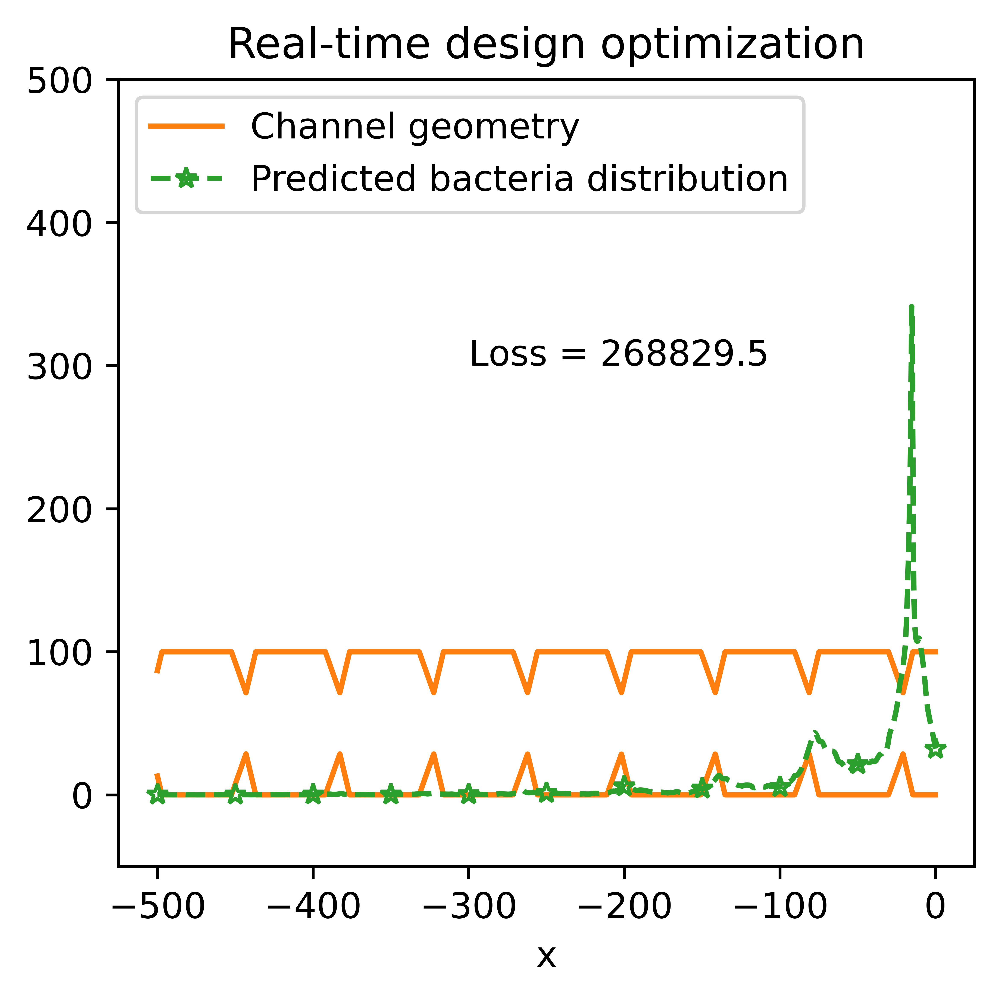

6 0.172360235825181 loss =  395805.15625 loss_min =  268829.5
7 1.0658767810091376 loss =  252541.859375 loss_min =  268829.5
L_p, x1, x2, x3, h  =  60.02325439453125 -30.011627197265625 -22.79586410522461 -14.355850219726562 29.7086181640625


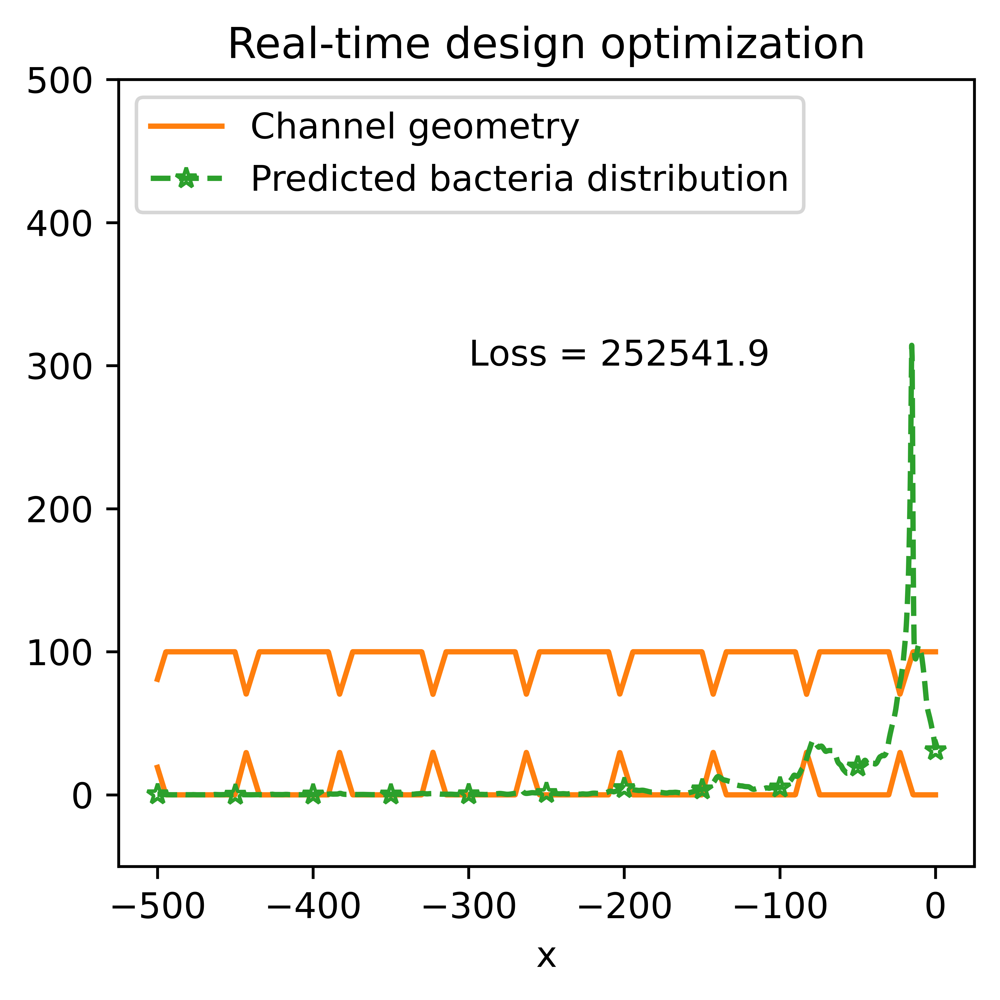

8 0.6510937204584479 loss =  541324.8125 loss_min =  252541.859375
9 0.6437053419649601 loss =  251669.03125 loss_min =  252541.859375
L_p, x1, x2, x3, h  =  60.08485412597656 -30.04242706298828 -21.9462890625 -14.449048042297363 29.66371726989746


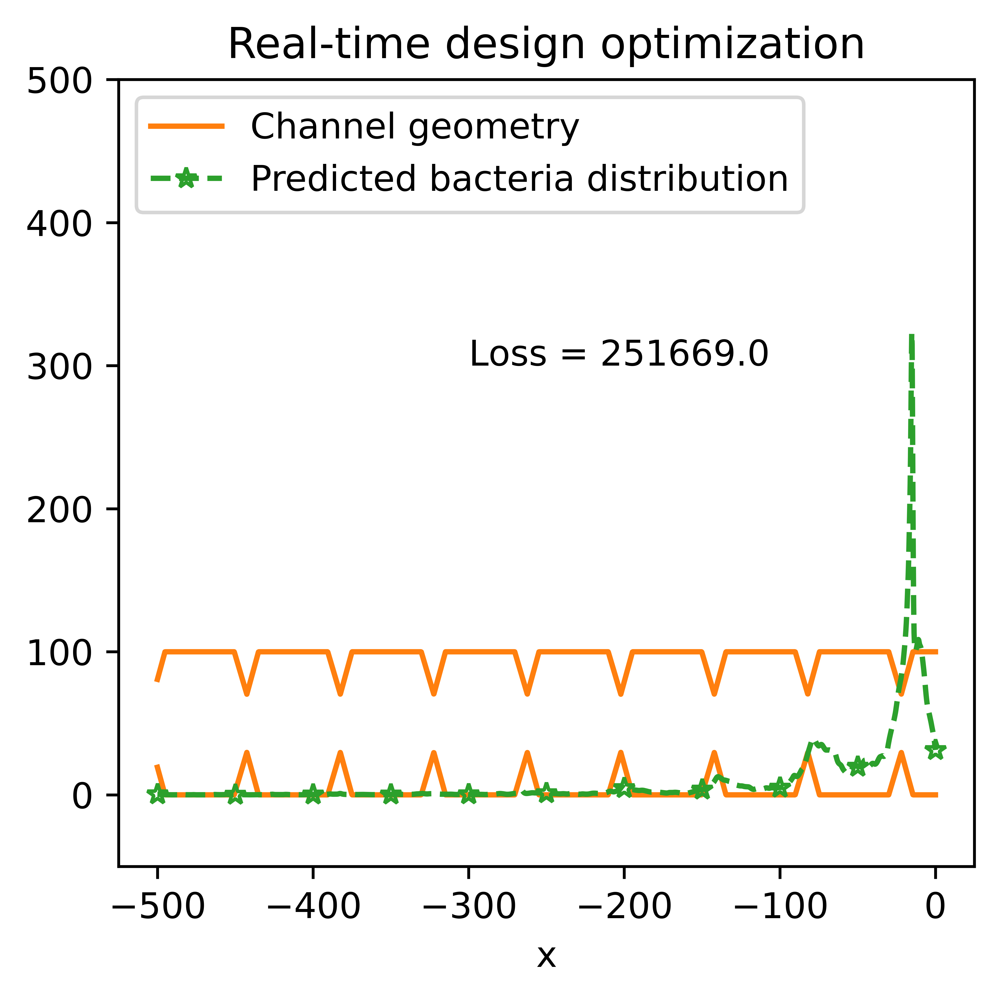

10 0.13095233030617237 loss =  469807.125 loss_min =  251669.03125
11 0.3944158898666501 loss =  260490.109375 loss_min =  251669.03125
12 0.3230292275547981 loss =  261675.953125 loss_min =  251669.03125
13 0.5338956397026777 loss =  254965.0 loss_min =  251669.03125
14 0.3748635947704315 loss =  251668.125 loss_min =  251669.03125
L_p, x1, x2, x3, h  =  60.18003845214844 -30.09001922607422 -19.74384307861328 -14.50933837890625 29.493669509887695


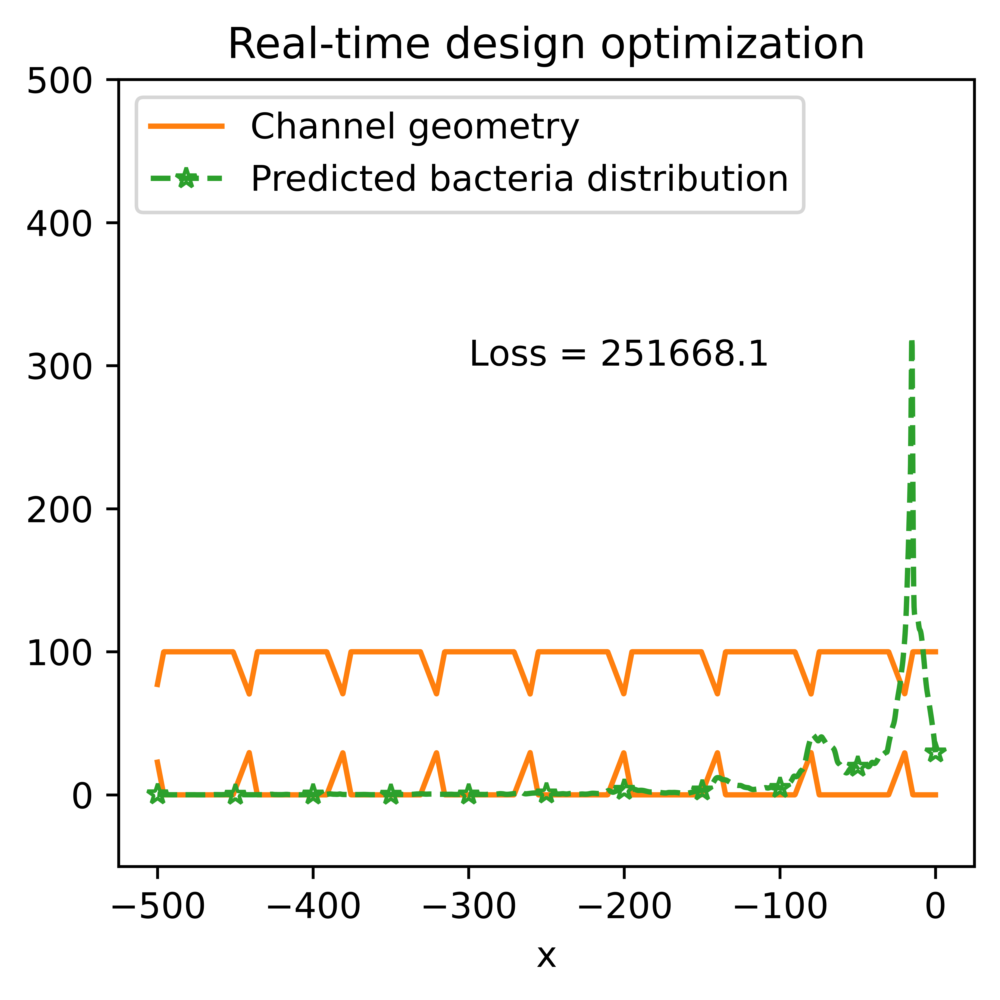

15 0.11917289160192013 loss =  260877.671875 loss_min =  251668.125
16 0.3115288009867072 loss =  248742.921875 loss_min =  251668.125
L_p, x1, x2, x3, h  =  60.363155364990234 -30.181577682495117 -20.685882568359375 -13.975837707519531 29.906423568725586


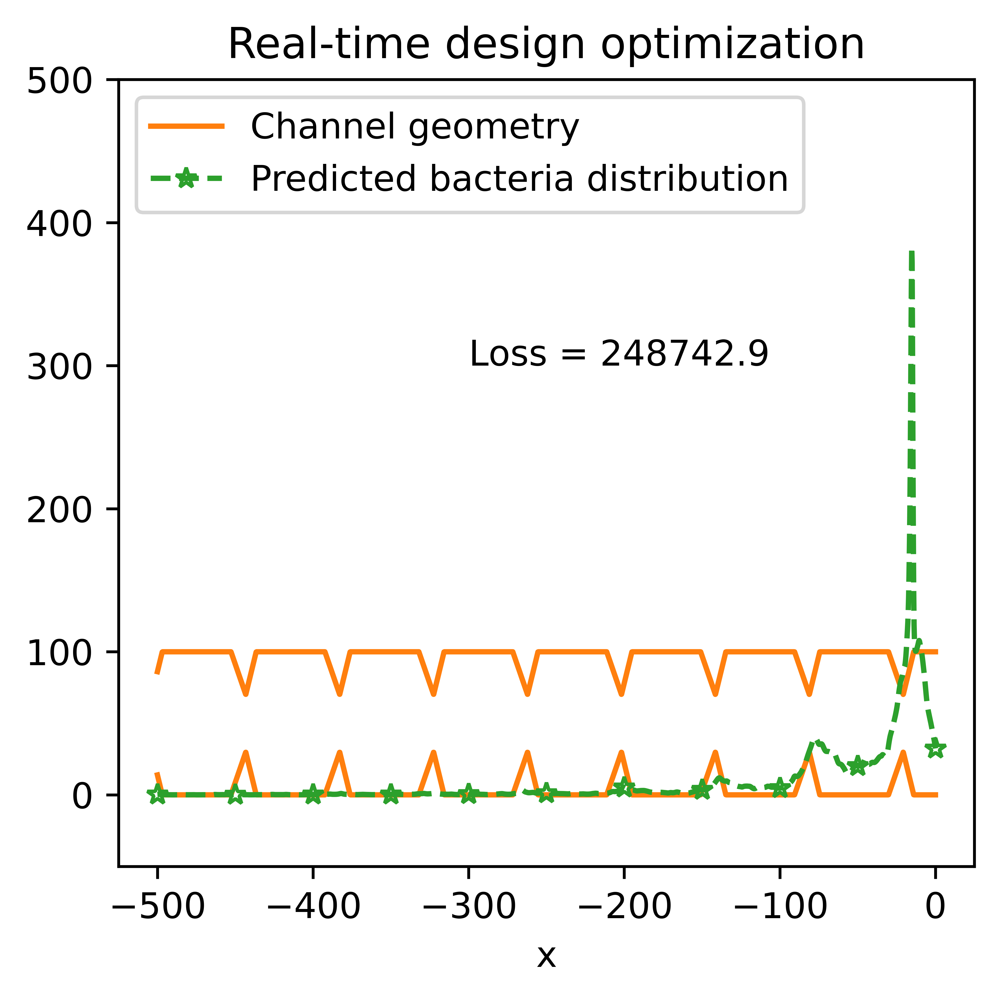

17 0.538684262894094 loss =  269155.34375 loss_min =  248742.921875
18 0.12900217063724995 loss =  255832.96875 loss_min =  248742.921875
19 0.27847418282181025 loss =  245881.140625 loss_min =  248742.921875
L_p, x1, x2, x3, h  =  60.14725875854492 -30.07362937927246 -20.088825225830078 -14.31826400756836 29.95262908935547


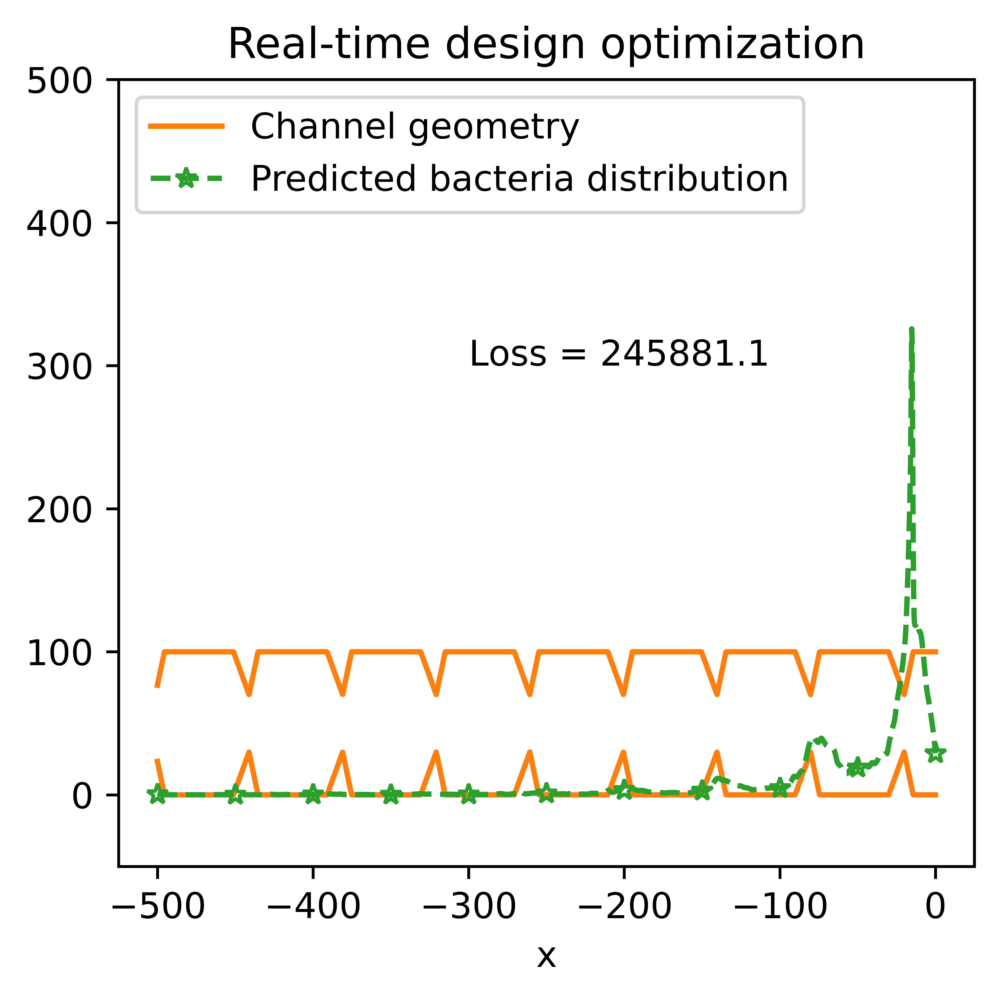

20 0.260040414519608 loss =  250655.265625 loss_min =  245881.140625
21 0.23402467742562294 loss =  389370.25 loss_min =  245881.140625
22 0.8396165333688259 loss =  568995.25 loss_min =  245881.140625
23 0.28066536504775286 loss =  427435.15625 loss_min =  245881.140625
24 0.11715127062052488 loss =  388527.9375 loss_min =  245881.140625
25 0.4139478821307421 loss =  559383.9375 loss_min =  245881.140625
26 0.48747042659670115 loss =  251842.390625 loss_min =  245881.140625
27 0.11828599777072668 loss =  603800.8125 loss_min =  245881.140625
28 0.10823732241988182 loss =  495437.40625 loss_min =  245881.140625
29 0.1418777210637927 loss =  595226.5 loss_min =  245881.140625
30 0.38977377116680145 loss =  245381.578125 loss_min =  245881.140625
L_p, x1, x2, x3, h  =  60.05711364746094 -30.02855682373047 -20.66651153564453 -14.61356258392334 29.882064819335938


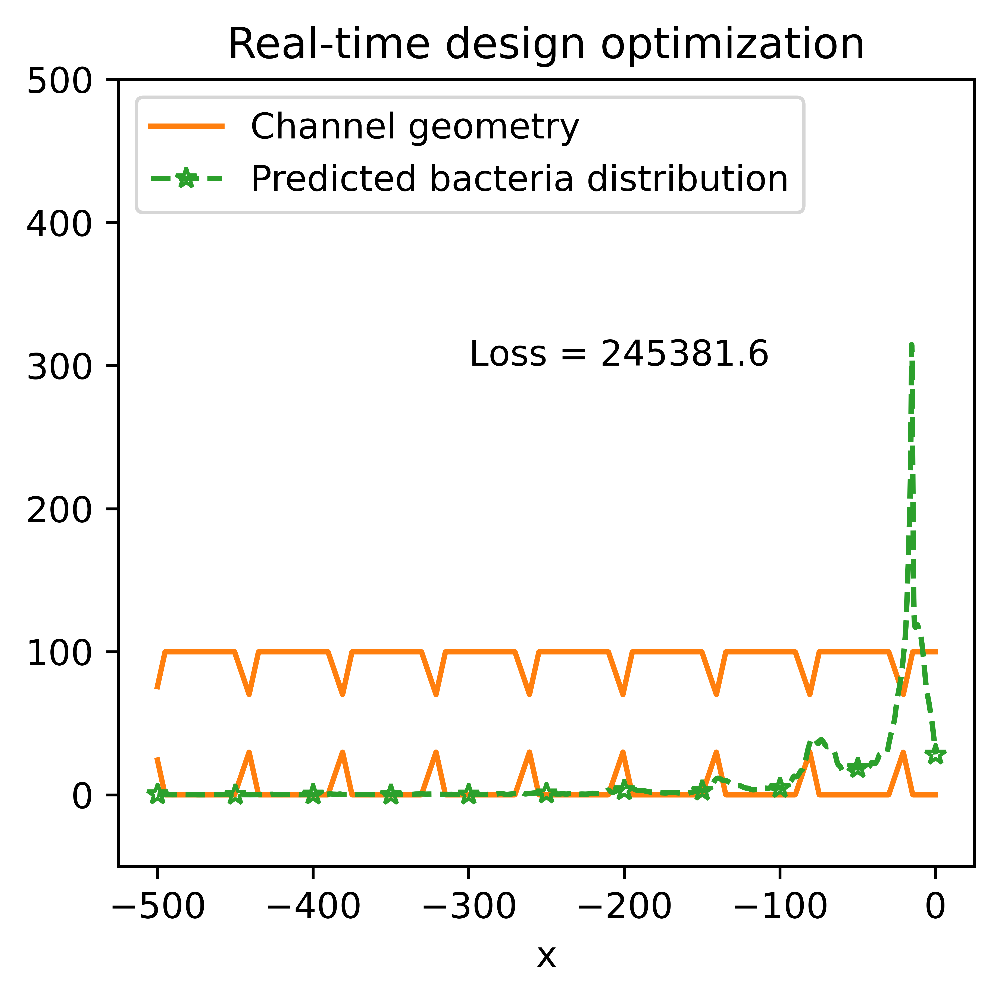

31 0.504846497438848 loss =  245312.59375 loss_min =  245381.578125
L_p, x1, x2, x3, h  =  60.01765441894531 -30.008827209472656 -21.855201721191406 -14.758447647094727 29.931476593017578


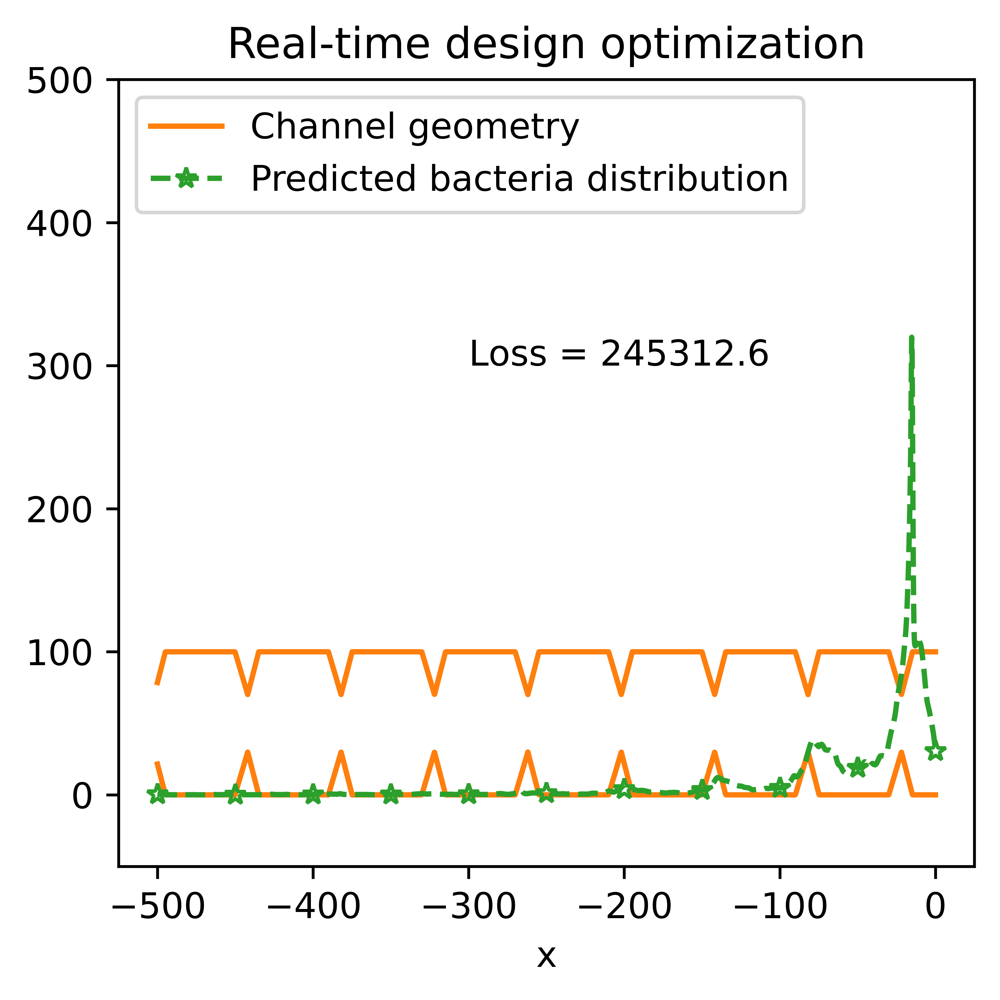

32 0.36352845281362534 loss =  249429.546875 loss_min =  245312.59375
33 0.9609270943328738 loss =  246265.671875 loss_min =  245312.59375
34 0.23266306426376104 loss =  248281.46875 loss_min =  245312.59375
35 0.24853125680238008 loss =  244951.34375 loss_min =  245312.59375
L_p, x1, x2, x3, h  =  60.00992202758789 -30.004961013793945 -22.167613983154297 -14.835811614990234 29.97693634033203


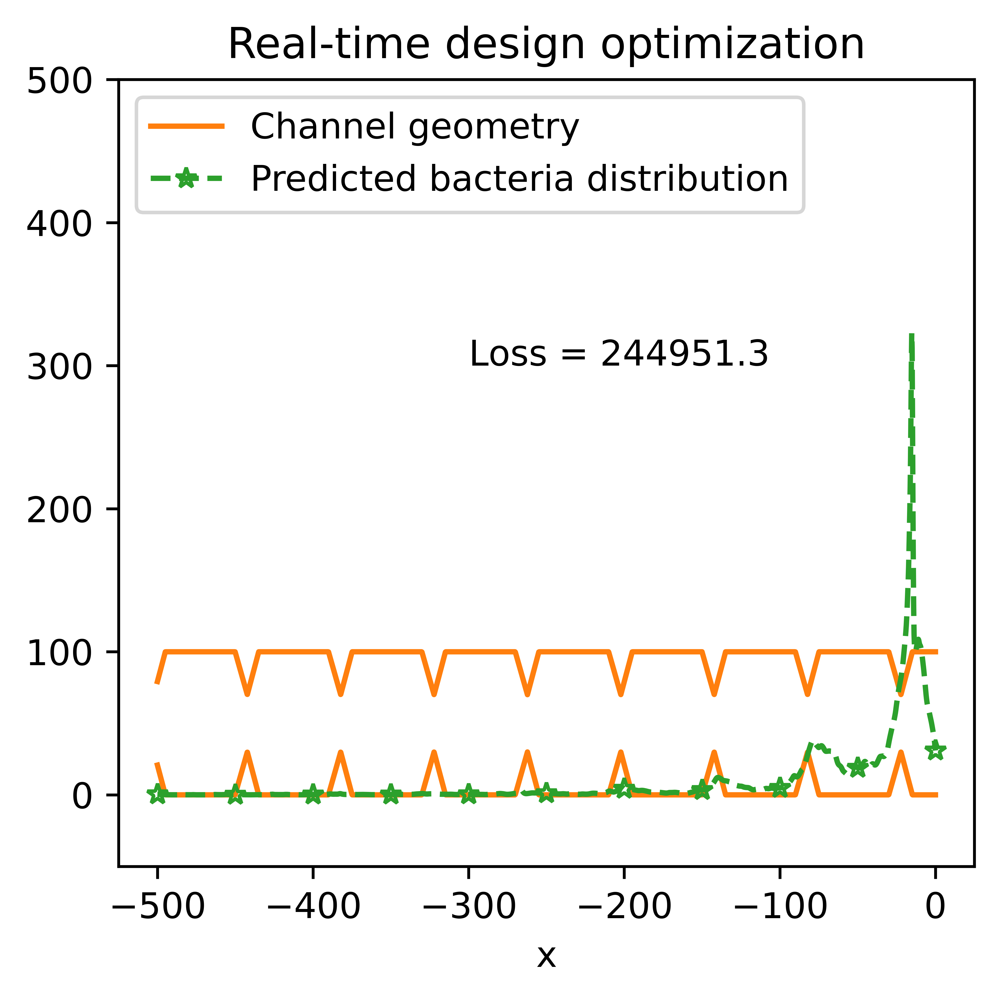

36 1.0142063610255718 loss =  243375.421875 loss_min =  244951.34375
L_p, x1, x2, x3, h  =  60.0341682434082 -30.0170841217041 -20.806034088134766 -14.864941596984863 29.957504272460938


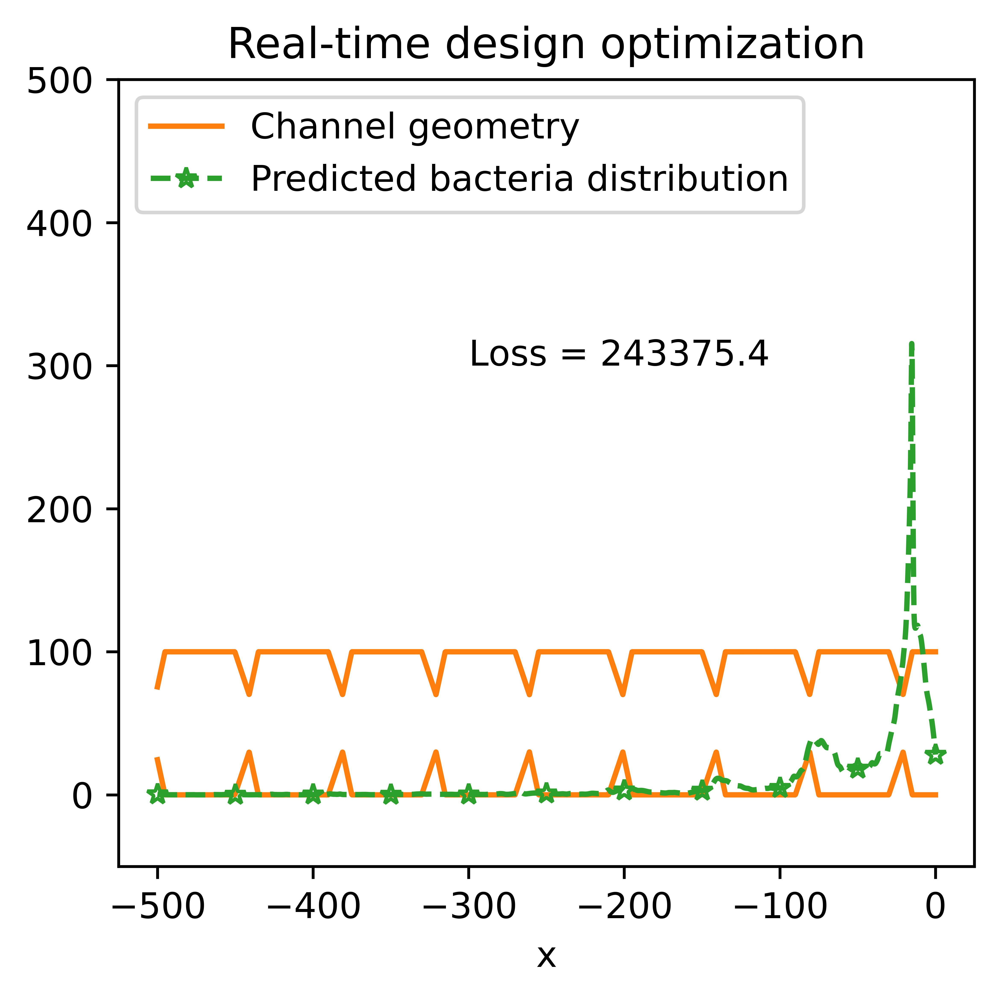

37 0.12056335341185331 loss =  386393.09375 loss_min =  243375.421875
38 0.20835411176085472 loss =  247531.203125 loss_min =  243375.421875
39 0.118715301156044 loss =  244996.484375 loss_min =  243375.421875
40 0.14417584240436554 loss =  246433.6875 loss_min =  243375.421875
41 0.107005481608212 loss =  585112.1875 loss_min =  243375.421875
42 0.12055583950132132 loss =  369248.3125 loss_min =  243375.421875
43 0.08277726732194424 loss =  255774.421875 loss_min =  243375.421875
44 0.12007428705692291 loss =  257648.53125 loss_min =  243375.421875
45 0.1300145098939538 loss =  250435.78125 loss_min =  243375.421875
46 0.4284456092864275 loss =  243314.359375 loss_min =  243375.421875
L_p, x1, x2, x3, h  =  60.05698013305664 -30.02849006652832 -20.656665802001953 -14.755815505981445 29.995384216308594


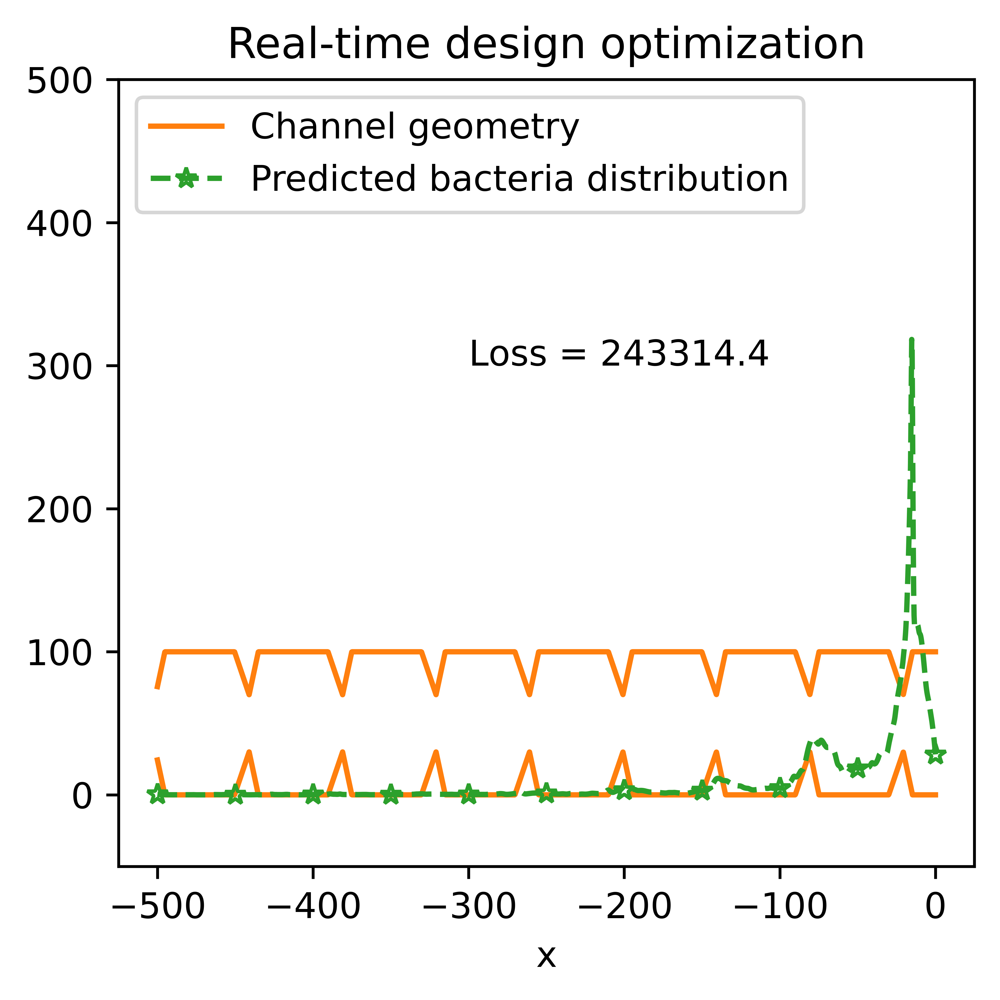

47 0.5313326604664326 loss =  244741.078125 loss_min =  243314.359375
48 0.14527303632348776 loss =  520650.5 loss_min =  243314.359375
49 0.2535179192200303 loss =  242889.921875 loss_min =  243314.359375
L_p, x1, x2, x3, h  =  60.067596435546875 -30.033798217773438 -20.535770416259766 -14.873918533325195 29.996110916137695


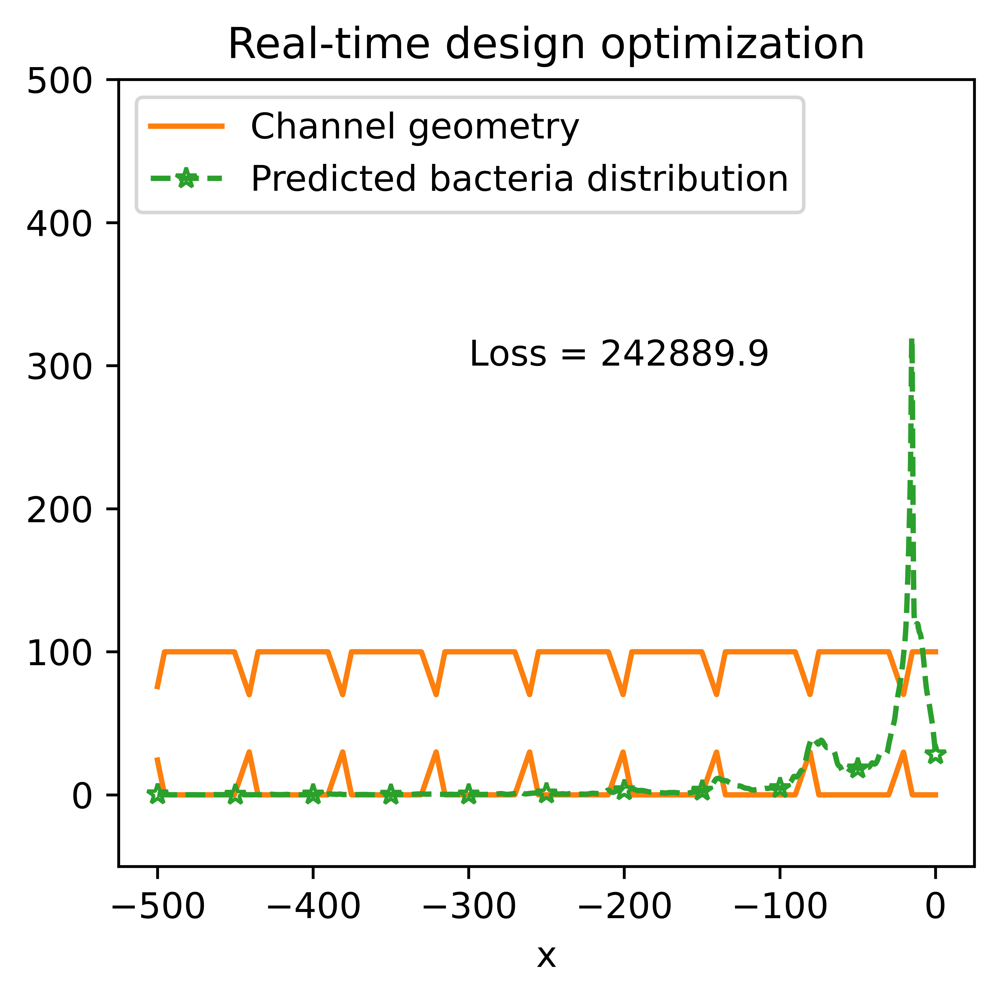

50 0.21183940768241882 loss =  353515.3125 loss_min =  242889.921875
51 0.1794752385467291 loss =  246885.046875 loss_min =  242889.921875
52 0.5670754322782159 loss =  242868.75 loss_min =  242889.921875
L_p, x1, x2, x3, h  =  60.04279327392578 -30.02139663696289 -20.837196350097656 -14.866009712219238 29.99814224243164


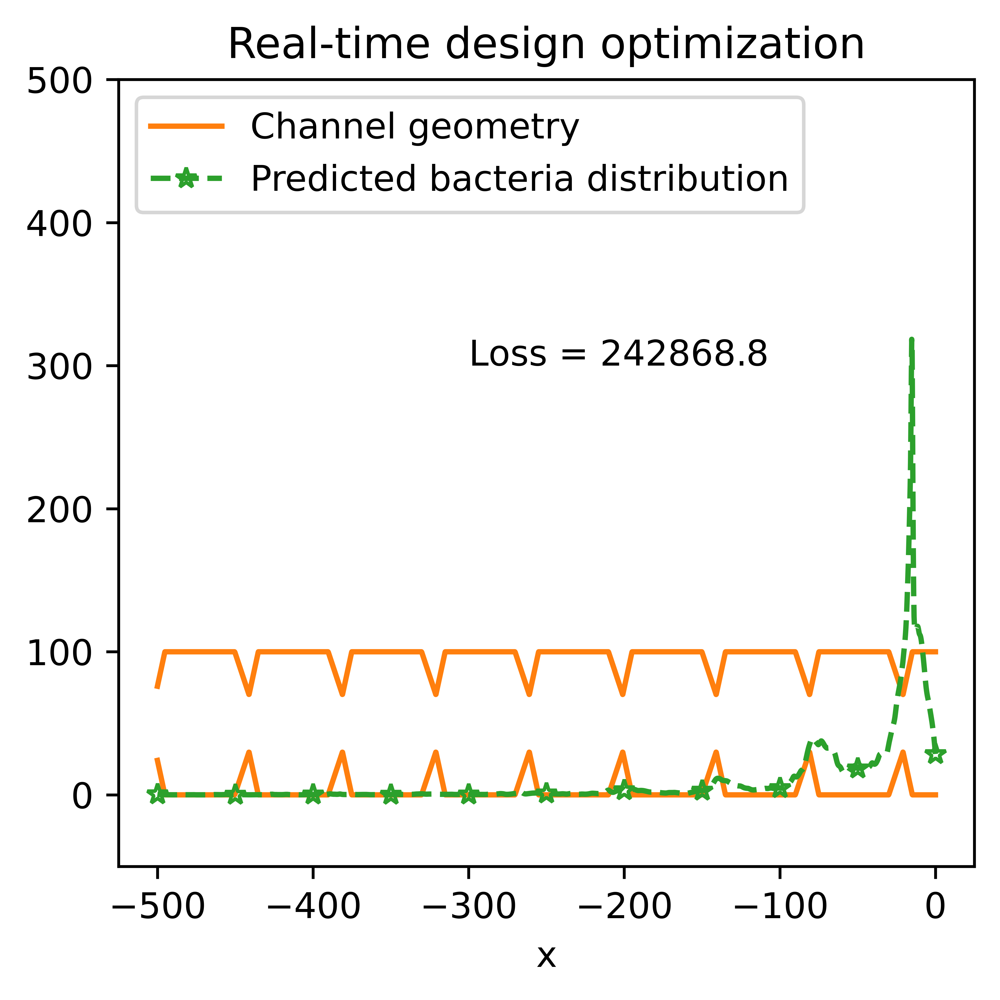

53 0.32735458202660084 loss =  242982.078125 loss_min =  242868.75
54 0.47390993032604456 loss =  243805.8125 loss_min =  242868.75
55 0.25294997077435255 loss =  262782.59375 loss_min =  242868.75
56 0.7370154652744532 loss =  243233.953125 loss_min =  242868.75
57 0.3145157638937235 loss =  244352.671875 loss_min =  242868.75
58 0.9065756080672145 loss =  244641.78125 loss_min =  242868.75
59 0.23188235145062208 loss =  271112.0625 loss_min =  242868.75
60 0.310652282088995 loss =  244784.625 loss_min =  242868.75
61 0.24277901463210583 loss =  242925.390625 loss_min =  242868.75
62 0.6413391036912799 loss =  244653.390625 loss_min =  242868.75
63 0.5115343043580651 loss =  242682.328125 loss_min =  242868.75
L_p, x1, x2, x3, h  =  60.13629150390625 -30.068145751953125 -20.13658905029297 -14.97691822052002 29.99895477294922


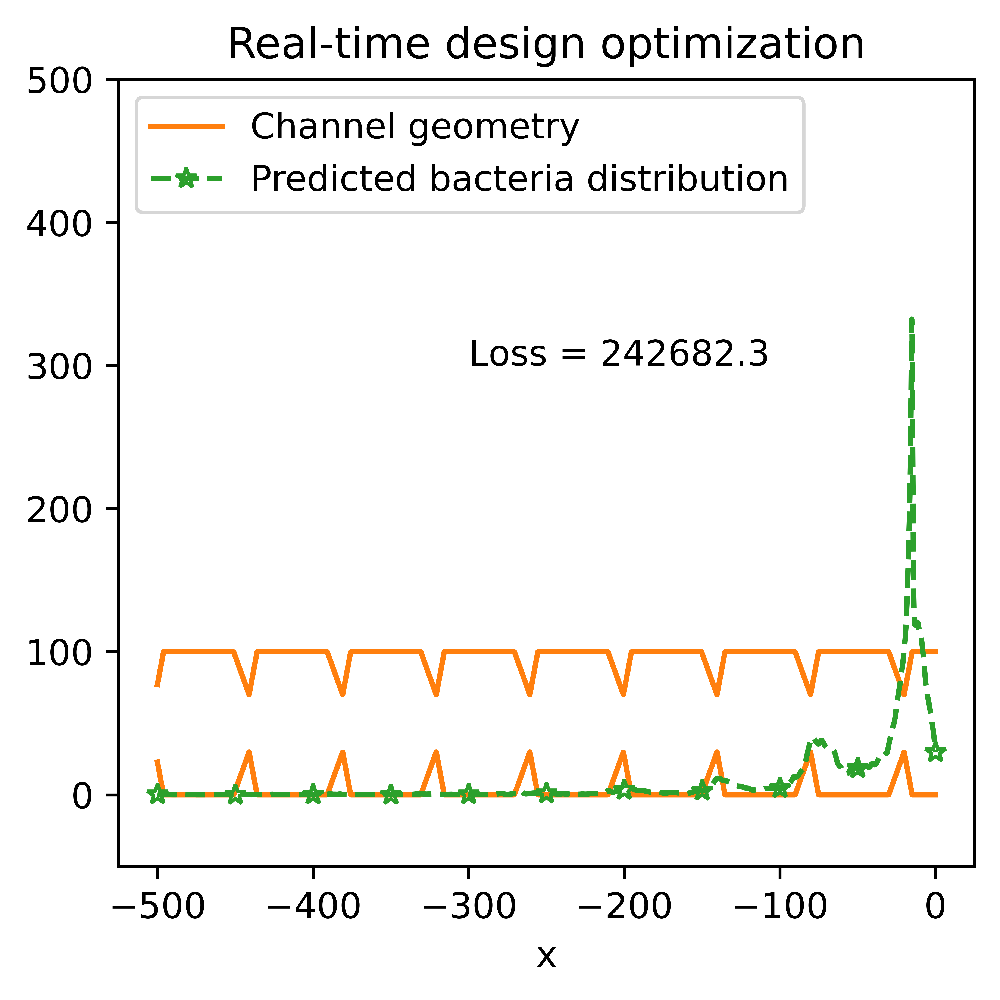

64 0.5243371669203043 loss =  242519.25 loss_min =  242682.328125
L_p, x1, x2, x3, h  =  60.12031555175781 -30.060157775878906 -20.283435821533203 -15.014368057250977 29.997905731201172


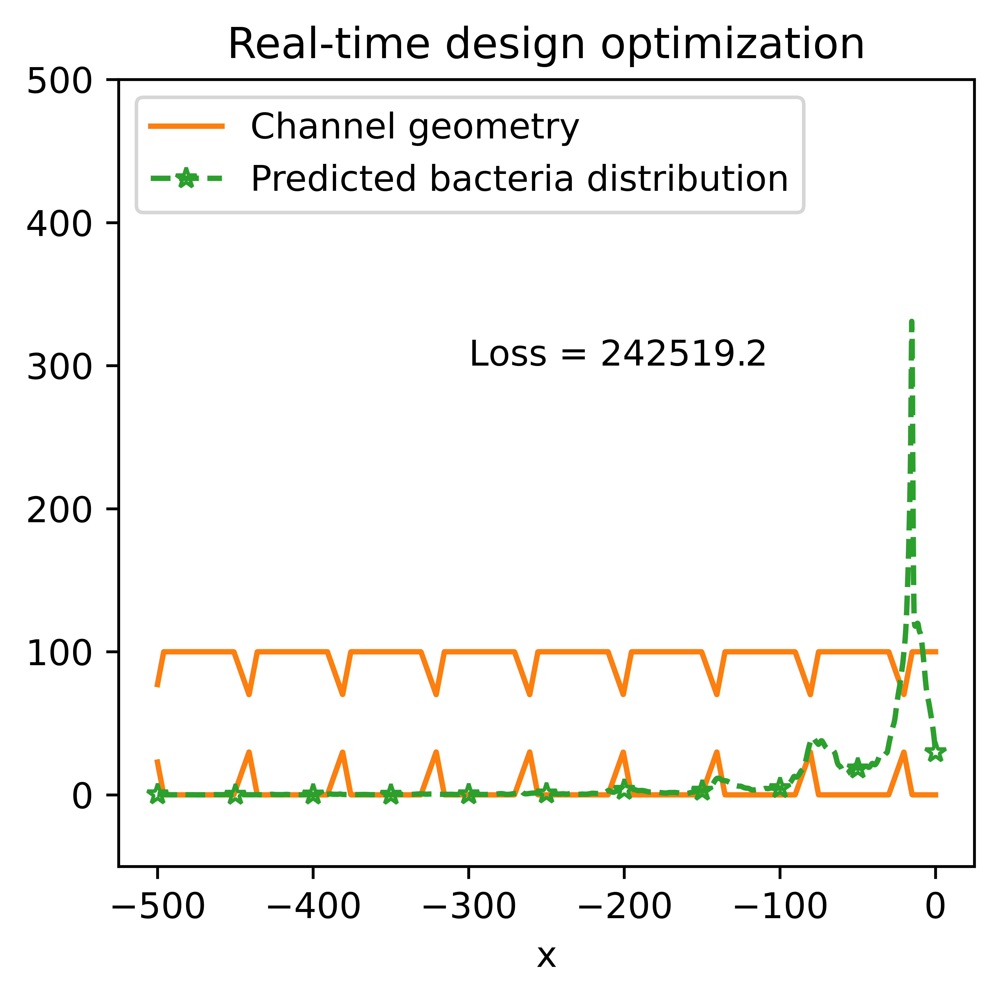

65 0.5610102415084839 loss =  237079.65625 loss_min =  242519.25
L_p, x1, x2, x3, h  =  60.447566986083984 -30.223783493041992 -19.34814453125 -15.006885528564453 29.996143341064453


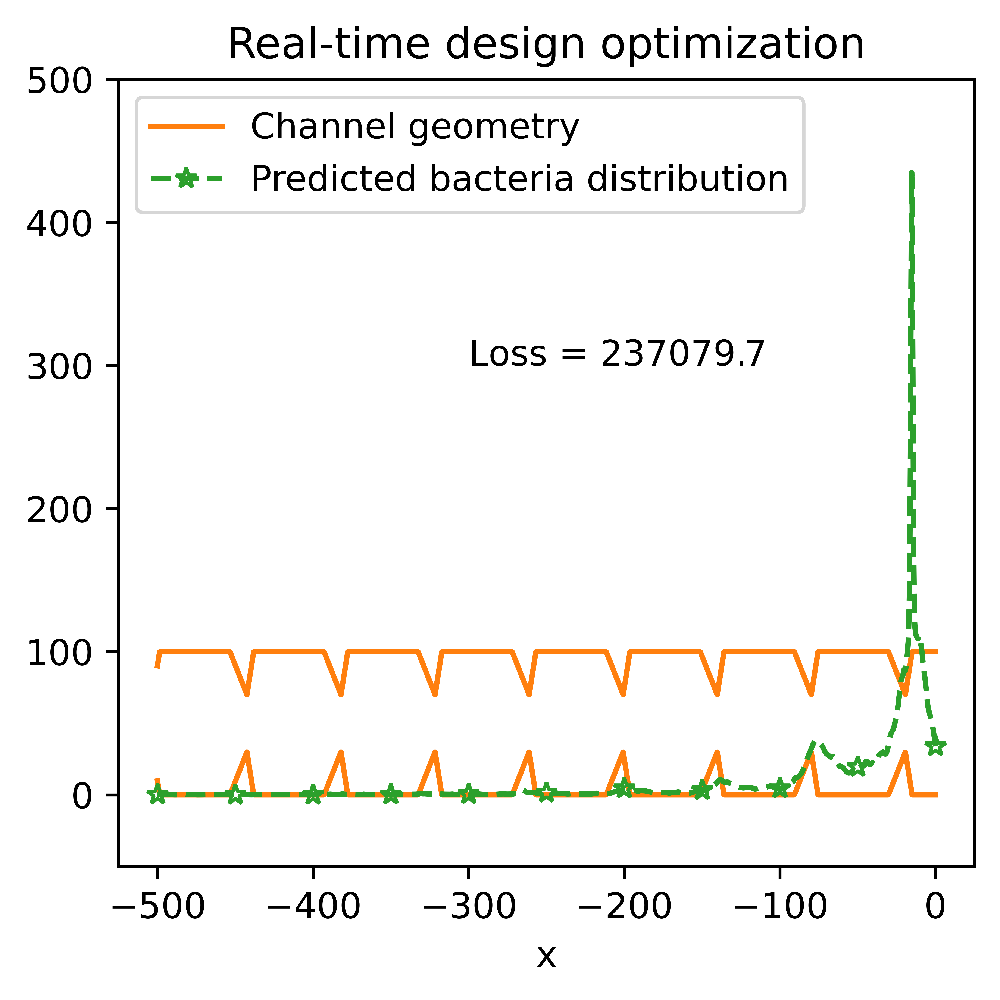

66 0.18057339824736118 loss =  218285.609375 loss_min =  237079.65625
L_p, x1, x2, x3, h  =  62.33879852294922 -31.16939926147461 -10.791854858398438 -15.758878707885742 29.9963436126709


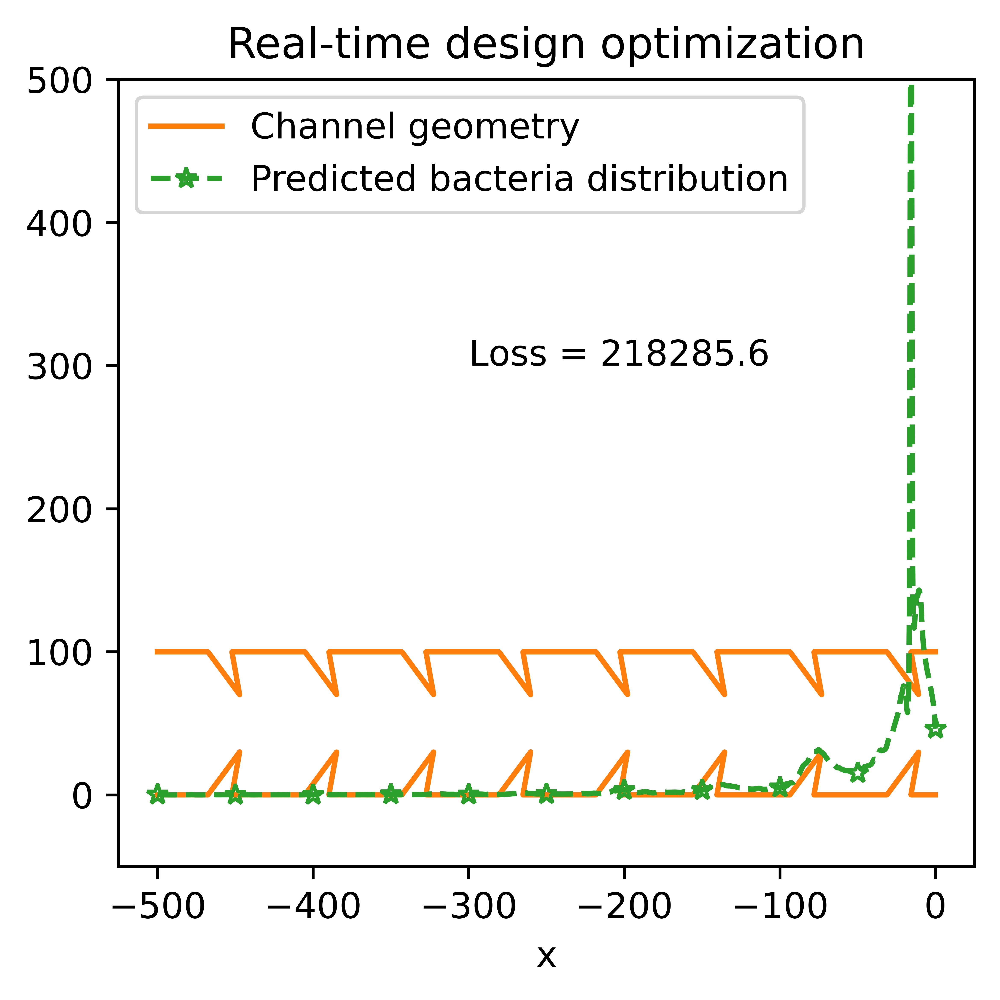

67 0.32689268328249454 loss =  248317.15625 loss_min =  218285.609375
68 0.5378138842061162 loss =  224299.296875 loss_min =  218285.609375
69 0.6913078688085079 loss =  259398.78125 loss_min =  218285.609375
70 0.7184393424540758 loss =  226718.0625 loss_min =  218285.609375
71 0.11781597509980202 loss =  262287.96875 loss_min =  218285.609375
72 0.3591682054102421 loss =  220290.421875 loss_min =  218285.609375
73 0.11722559481859207 loss =  304898.1875 loss_min =  218285.609375
74 0.554356949403882 loss =  230112.171875 loss_min =  218285.609375
75 0.6208689110353589 loss =  218253.96875 loss_min =  218285.609375
L_p, x1, x2, x3, h  =  62.421268463134766 -31.210634231567383 -11.81039047241211 -15.58853530883789 29.994712829589844


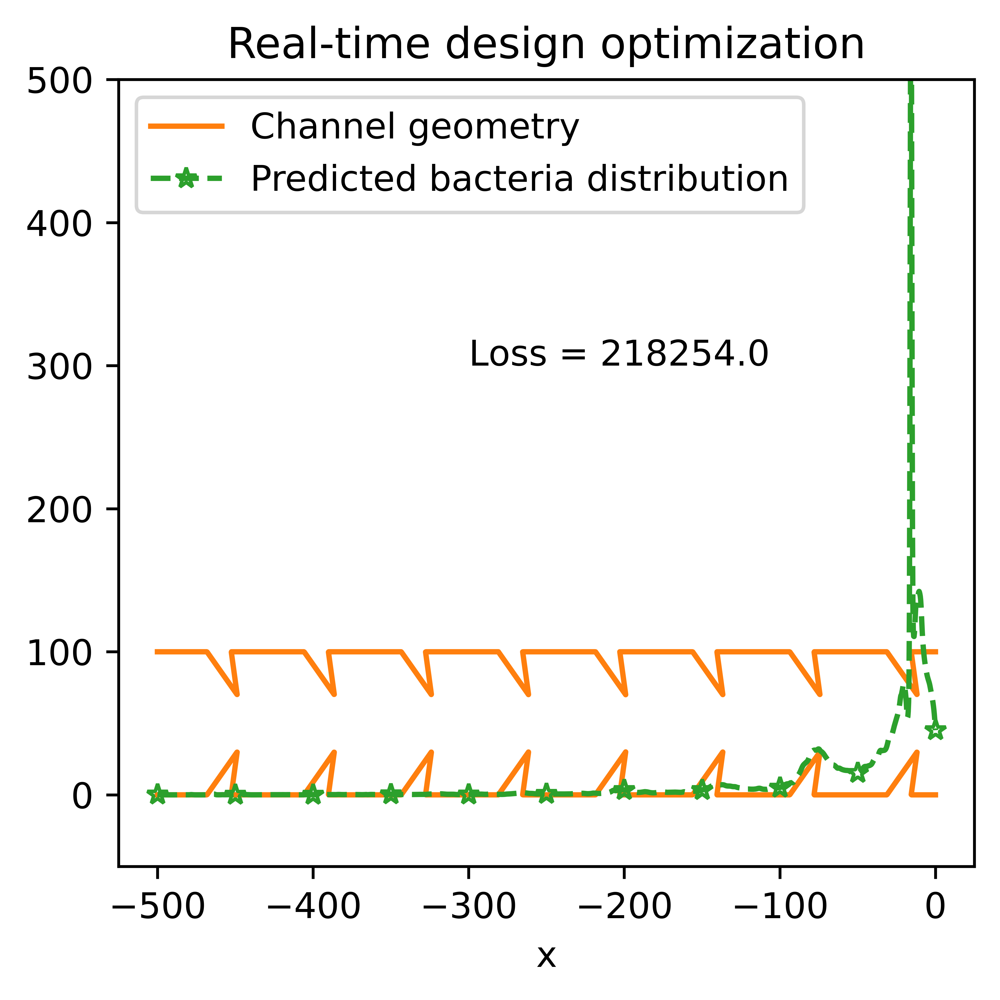

76 0.26916456036269665 loss =  457144.09375 loss_min =  218253.96875
77 1.2137021198868752 loss =  234613.921875 loss_min =  218253.96875
78 0.5407718140631914 loss =  227722.640625 loss_min =  218253.96875
79 0.3574688667431474 loss =  234627.6875 loss_min =  218253.96875
80 0.32834704499691725 loss =  220107.265625 loss_min =  218253.96875
81 0.16331197507679462 loss =  229452.984375 loss_min =  218253.96875
82 0.2005784483626485 loss =  227462.46875 loss_min =  218253.96875
83 0.14193231612443924 loss =  282305.0 loss_min =  218253.96875
84 0.5879840115085244 loss =  239037.15625 loss_min =  218253.96875
85 0.23733197432011366 loss =  240329.515625 loss_min =  218253.96875
86 0.2489980859681964 loss =  236959.59375 loss_min =  218253.96875
87 0.40323033183813095 loss =  223523.84375 loss_min =  218253.96875
88 0.39690780360251665 loss =  219124.875 loss_min =  218253.96875
89 0.4689893862232566 loss =  234298.96875 loss_min =  218253.96875
90 0.32560972683131695 loss =  274770.03125

In [2]:
################################################################
# inverse optimization for 1d
################################################################
torch.manual_seed(0)
np.random.seed(0)
torch.cuda.manual_seed(0)
torch.backends.cudnn.deterministic = True

model = torch.load("catheter_plain_length_model_1d1000", map_location=device)


epochs = 100

# constraints   
#               60 < L_p < 250
#               x1 = -0.5L_p 
#               
#               15 < x3 - x1 < L_p/2
#             -L_p < x2      < 0
#               20 < h       < 30
# def transfer(theta):
def transfer(theta):
    
    L_p = 60 + (250 - 60)/(1 + torch.exp(theta[0]))
    x1 = -0.5*L_p
    x3 = x1  + 15 + (L_p/2 - 15)/(1 + torch.exp(theta[2]))
    x2 = -L_p  + L_p/(1 + torch.exp(theta[1]))
    h = 20   + (10)/(1 + torch.exp(theta[3]))
    return L_p, x1, x2, x3, h


def inv_transfer(L_p, x2, x3, h):
    x1 = -0.5*L_p
    theta = np.zeros(4)
    theta[0] = np.log( (250 - 60)/(L_p - 60) - 1 )
    theta[1] = np.log( L_p/(x2 + L_p) - 1 )
    theta[2] = np.log( (L_p/2 - 15)/(x3 - x1  - 15) - 1 )
    theta[3] = np.log( 10/(h - 20 ) - 1 )
    return theta

L_p, x2, x3, h = 100.0, -40.0, -30.0, 25.0
theta0 =  inv_transfer(L_p, x2, x3, h) 
print("initialize : ", theta0)


bacteria_pred = []
L_x = 500
N_s = 2001
xx_mask = (torch.linspace(1.0, 0, N_s) * (-L_x)).to(device)

max_iter = 100


loss_min = torch.tensor(np.inf)

loss_all = []
theta_min = np.copy(theta0)
theta_min_perturbed = np.copy(theta_min)


def saveplot(theta, out, savefig_name):
    bacteria_pred.append(out)
    L_p, x1, x2, x3, h = transfer(theta)
    mesh = x.detach().cpu().numpy()
    
    current_loss = (-torch.sum(torch.matmul(out, xx_mask))* L_x/N_s).item()
    
    print("L_p, x1, x2, x3, h  = ", L_p.item(), x1.item(), x2.item(), x3.item(), h.item())
    plt.figure(figsize=(4,4), dpi=1200)
    plt.title("Real-time design optimization")
    plt.plot(mesh[0, :, 0], mesh[0, :, 1], color="C1", label="Channel geometry")
    plt.plot(mesh[0, :, 0], 100-mesh[0, :, 1], color="C1")
    
    plt.plot(xx_mask.detach().cpu().numpy(), out.detach().cpu().numpy().T, "--*", color="C2", fillstyle='none', markevery=len(xx_mask)//10, label="Predicted bacteria distribution")
    
    plt.legend(loc="upper left")
    plt.ylim([-50,500])
    plt.xlabel(r"x")
    
    plt.text(-300,300,"Loss = "+r"$%3.1f$" %current_loss,\
          bbox={'facecolor':'white','alpha':1,'edgecolor':'none','pad':1})
    
    
    plt.tight_layout()
    plt.savefig(savefig_name)
    plt.show()
    
plot_id = 0

# first_figure
theta = torch.tensor(theta_min_perturbed.astype(np.float32) , requires_grad=True)
L_p, x1, x2, x3, h = transfer(theta)  
x, XC, YC = catheter_mesh_1d_total_length(L_x, L_p, x2, x3, h, N_s)
out = torch.exp(model(x).squeeze())
saveplot(theta, out, "movie/design_iter" + str(plot_id).zfill(4) + ".png")
plot_id += 1

for ep in range(epochs):
    theta = torch.tensor(theta_min_perturbed.astype(np.float32) , requires_grad=True)
    optimizer = torch.optim.LBFGS([theta], max_iter=max_iter, lr=1.0, line_search_fn="strong_wolfe")
    
    t1 = default_timer()
    def loss_closure():
        L_p, x1, x2, x3, h = transfer(theta)
        x, XC, YC = catheter_mesh_1d_total_length(L_x, L_p, x2, x3, h, N_s)
        optimizer.zero_grad()
        out = torch.exp(model(x).squeeze())
        loss = -torch.sum(torch.matmul(out, xx_mask))* L_x/N_s
        loss.backward()
        loss_all.append(loss.item())
        return loss
    
    
    optimizer.step(loss_closure)

    t2 = default_timer()
 
    if ep%1==0:
        
        L_p, x1, x2, x3, h = transfer(theta)
        x, XC, YC = catheter_mesh_1d_total_length(L_x, L_p, x2, x3, h, N_s)
        out = torch.exp(model(x).squeeze())
        loss = -torch.sum(torch.matmul(out, xx_mask))* L_x/N_s
        print(ep, t2 - t1,  "loss = ", loss.item(), "loss_min = ", loss_min.item(),)
 
        if loss < loss_min:
            
            theta_min = theta.detach().numpy()
            loss_min = loss
            
            
            saveplot(theta, out, "movie/design_iter"+ str(plot_id).zfill(4)+".png")
            plot_id += 1
            
        theta_min_perturbed = theta_min + np.random.normal(loc=0.0, scale=1.0, size=len(theta_min))
        


# Visualize the optimization loss function

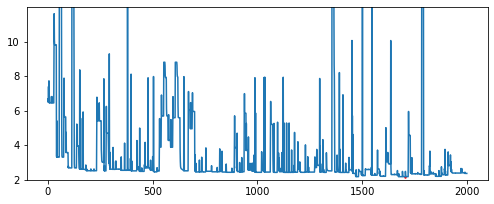

In [3]:
fig = plt.figure(figsize=(8,3))
ax = fig.add_axes([0.1, 0.1, 0.8, 0.8])
plt.plot(loss_all[0:2000], "-", markersize=1)
ax.set_yticks([2e5, 4e5, 6e5, 8e5, 1e6])
ax.set_xticks([0, 500, 1000, 1500, 2000])
ax.set_yticklabels([2, 4, 6, 8, 10])
ax.set_ylim([2e5, 12e5])
minind = np.array(loss_all).argmin()
plt.scatter(minind, loss_all[minind], color="red", s=2)
fig.savefig("optimization-loss.pdf")

# Verify Geo-FNO on the training data with the minimum loss

[785.           5.03008     62.87507539 -31.43753769  -8.69985683
 -15.85508335  28.01017283]
Sample id =  785.0
Minimum loss =  262913.0332581358 L_p, x2, x3, h =  tensor(62.8751) tensor(-8.6999) tensor(-15.8551) tensor(28.0102)
Predicted loss:  262338.7948075657


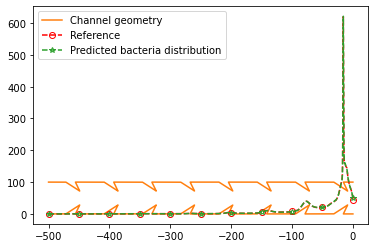

In [15]:
# All data design results
PATH = "/groups/esm/dzhuang/Catheter/allparam/length/"
INPUT_X = PATH+"x_1d_structured_mesh.npy"
INPUT_Y = PATH+"y_1d_structured_mesh.npy"
INPUT_para = PATH+"data_info.npy"
OUTPUT = PATH+"density_1d_data.npy"
n_data = 3000
inputX_raw = np.load(INPUT_X)[:, 0:n_data]
inputY_raw = np.load(INPUT_Y)[:, 0:n_data]
inputPara_raw = np.load(INPUT_para)[:, 0:n_data]
output_raw = np.load(OUTPUT)[:, 0:n_data]


# nx ny
L_x , N_s = 500.0, 2001

################################################################
# load data and data normalization
################################################################
inputX = inputX_raw[:, 0::3]
inputY = inputY_raw[:, 0::3]
inputPara = inputPara_raw[:, 0::3]
output = (output_raw[:, 0::3] + output_raw[:, 1::3] + output_raw[:, 2::3])/ 3.0


n_data = inputX.shape[1]
all_loss = np.zeros(n_data)


for i in range(n_data):
    
    sample, uf, L_p, x1, x2, x3, h = inputPara[:, i]
    xx_mask = numpy.linspace(1.0, 0, N_s) * (-L_x)
    all_loss[i] = -np.dot(output[:, i], xx_mask) * L_x/N_s

    

loss_min_ind = np.argmin(all_loss)
loss_min = all_loss[loss_min_ind]
sample, uf, L_p, x1, x2, x3, h = inputPara[:, loss_min_ind]

model = torch.load("catheter_plain_length_model_1d1000", map_location=device)
L_p, x2, x3, h =  torch.tensor(L_p, dtype=torch.float), torch.tensor(x2, dtype=torch.float), torch.tensor(x3, dtype=torch.float), torch.tensor(h, dtype=torch.float)

X_Y, X, Y = catheter_mesh_1d_total_length(L_x, L_p, x2, x3, h, N_s)
out = torch.exp(model(X_Y).squeeze()).detach().cpu().numpy()


print(inputPara[:, loss_min_ind])
print("Sample id = ", sample)
print("Minimum loss = ", loss_min, "L_p, x2, x3, h = ", L_p, x2, x3, h)

xx_mask = numpy.linspace(1.0, 0, N_s) * (-L_x)
print("Predicted loss: ", -np.dot(out, xx_mask) * L_x/N_s)

density = output[:, loss_min_ind]
mesh_X = np.flip(inputX[:, loss_min_ind])
mesh_Y = np.flip(inputY[:, loss_min_ind])

plt.figure()
plt.plot(mesh_X, mesh_Y, color="C1", label="Channel geometry")
plt.plot(mesh_X, 100-mesh_Y, color="C1")
plt.plot(xx_mask, density, "--o", color="red", markevery=len(xx_mask)//10, fillstyle='none', label="Reference")     
plt.plot(xx_mask, out, "--*", color="C2", fillstyle='none', markevery=len(xx_mask)//10, label="Predicted bacteria distribution")
plt.legend()


# Final optimal design

## Draw initial guess and final designs 

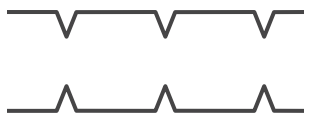

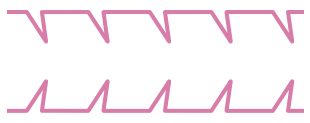

In [17]:
# Draw initial guess and final designs 

L_x, L_p, x2, x3, h = 500, 100.0, -40.0, -30.0, 25.0
x1 = -0.5*L_p
N_s = 2001
X0,Y0 = numpy_catheter_mesh_1d_total_length(L_x, L_p, x1, x2, x3, h, N_s)
plt.figure(figsize=(6, 2))
plt.plot(X0, 100-Y0, color="#464546", linewidth=4.0)
plt.plot(X0, Y0, color="#464546", linewidth=4.0)
plt.axis('off'),
plt.xlim([-300, 0])
ax = plt.gca()
ax.set_aspect('equal', adjustable='box')
plt.savefig("initial_guess.pdf")

L_p, x1, x2, x3, h = 62.2564697265625,  -31.12823486328125, -11.565677642822266, -15.864848136901855, 29.99827766418457
x1 = -0.5*L_p
N_s = 2001
X0,Y0 = numpy_catheter_mesh_1d_total_length(L_x, L_p, x1, x2, x3, h, N_s)
plt.figure(figsize=(6, 2))
plt.plot(X0, 100-Y0, color="#D87CA9", linewidth=4.0)
plt.plot(X0, Y0, color="#D87CA9", linewidth=4.0)
plt.axis('off'),
plt.xlim([-300, 0])
ax = plt.gca()
ax.set_aspect('equal', adjustable='box')
plt.savefig("final_guess.pdf")





## Verify the final optimal design

optimal_design_data/tri1_U020uf5alpha1.5tauR2_19.5626_15.2634_29.9983.h5old.h5
optimal_design_data/tri1_U020uf15alpha1.5tauR2_19.5626_15.2634_29.9983.h5
optimal_design_data/tri1_U020uf10alpha1.5tauR2_19.5626_15.2634_29.9983.h5
fno_loss =  218137.71875 ref_loss =  218837.35233834037


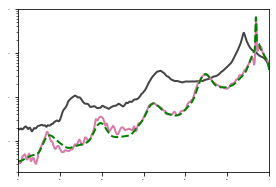

In [24]:
import glob
# Design validation

train_data_folder = "optimal_design_data"
t = 9


N_s, L_x = 2001, 500
bw_method = 1e-1
xx = np.linspace(-L_x, 0.0, N_s)
xx_mask = (torch.linspace(1.0, 0, N_s) * (-L_x)).to(device)

samples = [0]
x_mesh, y_mesh = np.zeros((len(samples), N_s)), np.zeros((len(samples), N_s))
density_1d_data_all = np.zeros((len(samples), N_s, 3))
density_1d_data = np.zeros((len(samples), N_s))
L_p, x1, x2, x3, h = 62.2564697265625,  -31.12823486328125, -11.565677642822266, -15.864848136901855, 29.99827766418457
# L_p, x1, x2, x3, h = 62.32211685180664, -31.16105842590332, -11.533348083496094, -16.148033142089844, 29.966632843017578

for i in range(len(samples)):
    
    x_mesh[i,:], y_mesh[i,:] = numpy_catheter_mesh_1d_total_length(L_x, L_p, x1, x2, x3, h, N_s)
    
    file_names = glob.glob(train_data_folder+"/tri*")
    for file_name in file_names:
        
        print(file_name)
        uf  = np.float64(  file_name[file_name.find("uf") + len("uf"):  file_name.find("alpha")]  )
        # sample is from 1 - 1000
        j = 0
        if uf < (5.0 + 10.0)/2:
            j = 0
        elif uf < (10. + 15.0)/2:
            j = 1
        elif uf < (15. + 20.0)/2:
            j = 2
        else:
            print("error! uf = ", uf)
            
        
        # preprocee density
        hf = h5py.File(file_name, "r")
        x_b = hf["config"][str(t+1)]["x"][:]
        y_b = hf["config"][str(t+1)]["y"][:]

        if(min(x_b) < -L_x):
            print("warning: bacteria out of the domain. file_name = ", file_name, " loc = ", min(x_b), " end point = ", -L_x)

        

        bacteria_1d_data = x_b[np.logical_and(x_b <= 0 , x_b >= -L_x)]
        n_particle = len(bacteria_1d_data)
        kernel = stats.gaussian_kde(bacteria_1d_data, bw_method = bw_method)
        density_1d_data_all[i, :, j] = kernel(xx)*n_particle
    
    density_1d_data[i, :] = np.mean(density_1d_data_all[i, :, :], axis=1)   
    
    
    
    ref_loss = -np.sum(np.matmul(density_1d_data[i, :], xx))* L_x/N_s
    x, XC, YC = catheter_mesh_1d_total_length(L_x, torch.tensor(L_p), torch.tensor(x2), torch.tensor(x3), h, N_s)
    out = torch.exp(model(x).squeeze())
    fno_loss = -torch.sum(torch.matmul(out, xx_mask))* L_x/N_s
    print("fno_loss = ", fno_loss.item(), "ref_loss = ", ref_loss)
       
    
    
    
    xx_mask = np.linspace(1.0, 0, N_s) * (-L_x)
    #######################################################################
    plt.figure(figsize=(4.5, 3))
    plt.plot(xx_mask, bacteria_pred[0].detach().cpu().numpy(), color="#464546", linewidth=2.0, label="initial design")
    plt.semilogy(xx_mask, bacteria_pred[-1].detach().cpu().numpy(), color="#D87CA9", linewidth=2.0, label="optimal design")
    plt.semilogy(xx_mask, density_1d_data[i, :], "--",  color="green", linewidth=2.0, label="reference")
    plt.xlim([-300, 0])
    plt.ylim([0.2, 1e3])
    
    plt.tick_params(labelsize=0) 
#     plt.legend()
#     plt.title("Bacteria Distribution")
#     plt.xlabel(r"x")
    plt.savefig("bacteria_population_semilogy.pdf")


